In [1]:
from functions_py import *
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
plt.rcParams.update({
    "image.origin": "lower",
    "image.aspect": 1,
    #"text.usetex": True,
    "grid.alpha": .5,
    "axes.linewidth":2,
    "lines.linewidth" : 1,
    "font.size":    15.0,
    "xaxis.labellocation": 'right',  # alignment of the xaxis label: {left, right, center}
    "yaxis.labellocation": 'top',  # alignment of the yaxis label: {bottom, top, center}
    "xtick.top":           True ,  # draw ticks on the top side
    "xtick.major.size":    8    ,# major tick size in points
    "xtick.minor.size":    4      ,# minor tick size in points
    "xtick.direction":     'in',
    "xtick.minor.visible": True,
    "ytick.right":           True ,  # draw ticks on the top side
    "ytick.major.size":    8    ,# major tick size in points
    "ytick.minor.size":    4      ,# minor tick size in points
    "ytick.direction":     'in',
    "ytick.minor.visible": True,
    "ytick.major.width":   2   , # major tick width in points
    "ytick.minor.width":   1 ,
    "xtick.major.width":   2   , # major tick width in points
    "xtick.minor.width":   1 ,
    "legend.framealpha": 0 ,
    "legend.loc": 'best',

})

# Michrochip images

## Raw Image

Filename: /share/storage2/connie/data/microchip/proc_bkgd_1x2/proc_skp_moduleC002_bkgd_clearVB300_NBINROW2_img75.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     160   (700, 325)   float32   
  1                1 ImageHDU       159   (700, 325)   float32   
  2                1 ImageHDU       159   (700, 325)   float32   
  3                1 ImageHDU       159   (700, 325)   float32   
None
----------------


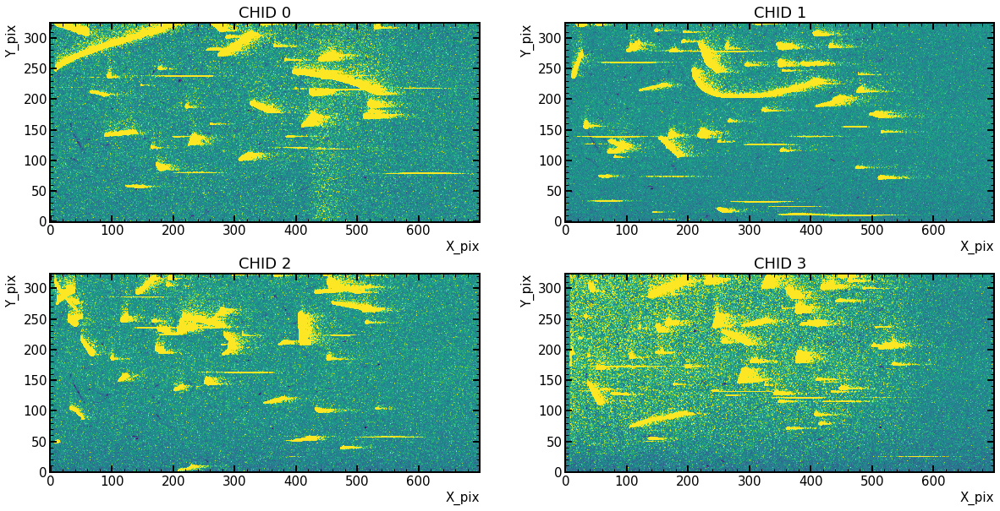

In [3]:
path='/share/storage2/connie/data/microchip/proc_bkgd_1x2/proc_skp_moduleC002_bkgd_clearVB300_NBINROW2_img75.fits'
hdu_list = fits.open(path)
print(hdu_list.info())
print('----------------')
# hdu_list[0].header
plt.figure(figsize=(20,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(hdu_list[i].data-np.median(hdu_list[i].data),vmin=-800,vmax=800)
    plt.title('CHID '+str(i))
    plt.ylabel('Y_pix')
    plt.xlabel('X_pix')
plt.show()

## Calibrated imges, medians subtracted, cleaned xtalk

CHID 0 Gain:(785.27 +- 3.16)ADUs
CHID 1 Gain:(792.18 +- 5.70)ADUs
CHID 2 Gain:(790.27 +- 3.32)ADUs
CHID 3 Gain:(791.55 +- 1.66)ADUs


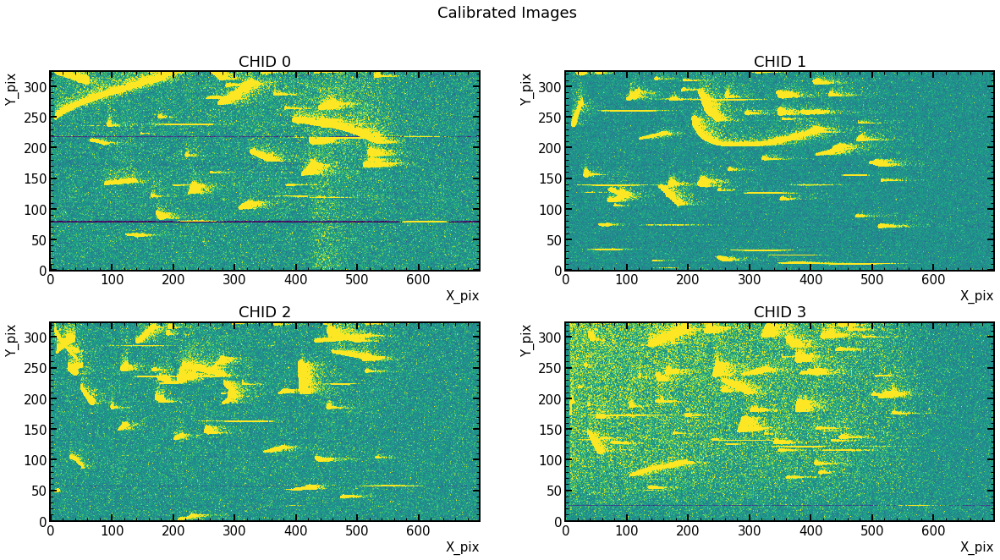

In [4]:
data_pre = precal(hdu_list,extensions=4)
gain, gain_err, data= LocalCalib(data_pre,extensions=4)
fig=plt.figure(figsize=(20,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(data[i],vmin=-1,vmax=1)
    plt.title('CHID '+str(i))
    plt.ylabel('Y_pix')
    plt.xlabel('X_pix')
    print("CHID "+str(i)+' Gain:({:.2f} +- {:.2f})ADUs'.format(gain[i],gain_err[i]))
plt.suptitle('Calibrated Images')
plt.savefig('IMAGES_POSCALIB.png', bbox_inches='tight', dpi=100)
    
plt.show()

    

In [5]:
sigma, sigma_err = LocalSigma(data,extensions=4)
for i in range(4):
    print('CHID '+str(i),r' Noise: ({:.3f} +- {:.3f}) e-'.format(sigma[i],sigma_err[i]))

CHID 0  Noise: (0.212 +- 0.003) e-
CHID 1  Noise: (0.195 +- 0.002) e-
CHID 2  Noise: (0.192 +- 0.002) e-
CHID 3  Noise: (0.188 +- 0.002) e-


# Masking

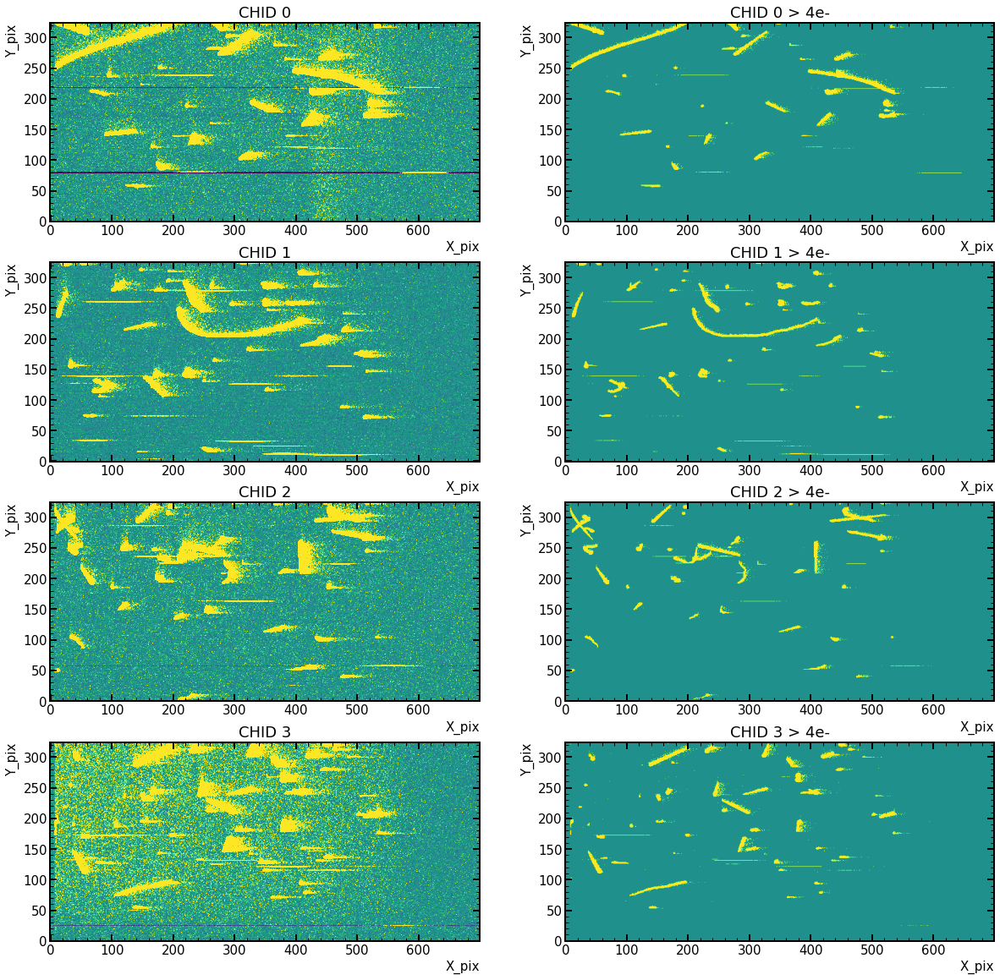

In [6]:
fig=plt.figure(figsize=(20,20))
for i in range(4):
    plt.subplot(4,2,2*(i+1)-1)
    plt.imshow(data[i],vmin=-1,vmax=1)
    plt.title('CHID '+str(i))
    plt.ylabel('Y_pix')
    plt.xlabel('X_pix')
    plt.subplot(4,2,2*(i+1))
    plt.imshow(data[i]>4,vmin=-1,vmax=1)
    plt.title('CHID '+str(i)+' > 4e-')
    plt.ylabel('Y_pix')
    plt.xlabel('X_pix')
plt.show()

In [7]:
import skimage.measure as sk

In [8]:
label=ndimage.label(data[1]>4,structure=[[1,1,1],[1,1,1],[1,1,1]])[0]

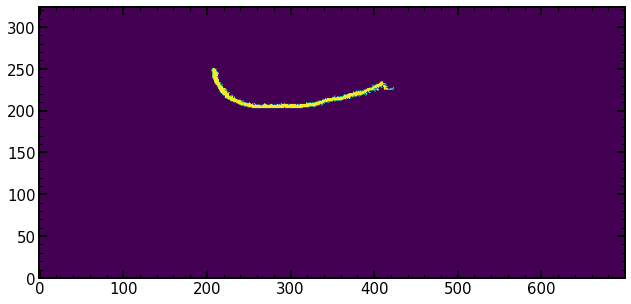

In [9]:
plt.figure(figsize=(15,5))
plt.imshow(label==145)
plt.show()

Getting only the High Energy Events

In [10]:
def sum_intensity(region, intensities):
    return np.sum(intensities[region])

rps=sk.regionprops(label,intensity_image=data[1],cache=False, extra_properties=[sum_intensity])
areas=[r.area for r in rps]
energy=[r.sum_intensity for r in rps]
centr=[r.weighted_centroid for r in rps]
ecce=[r.eccentricity for r in rps]
dic_props={"areas":areas,"energias":energy,'centroid':centr, "excentricidade":ecce}

In [11]:
import skimage as ski
ski.__version__

'0.18.1'

In [12]:
df=pd.DataFrame.from_dict(dic_props)
df.index = np.arange(1, len(df)+1)
df.head(35)

,areas,energias,centroid,excentricidade
1,3,58.683264,"(0.0, 3.5355892798576276)",1.000000
2,4,20.637969,"(11.792099302121027, 410.1150147740633)",0.912871
3,1,5.968864,"(11.0, 414.0)",0.000000
4,1,5.309836,"(11.0, 416.0)",0.000000
5,1,5.176566,"(11.0, 418.0)",0.000000
6,99,25725.889869,"(11.0, 464.3649756045393)",1.000000
7,1,4.993991,"(11.0, 521.0)",0.000000
8,1,4.315299,"(11.0, 524.0)",0.000000
9,1,4.553982,"(11.0, 526.0)",0.000000
10,1,4.263430,"(11.0, 528.0)",0.000000


In [13]:
energias=dic_props["energias"]
exce=dic_props["excentricidade"]
hee_list=np.where((np.array(energias)>80) & (np.array(exce)!=1))[0].tolist() #index od the dictionary of events ---> TRESHOLD OF 80 ELECTRONS TO BE HE

In [14]:
areas=dic_props["areas"]
see_list=np.where((np.array(exce)==1) & (np.array(areas)>9))[0].tolist() 

Getting there positions

In [15]:
HE_events=np.zeros_like(label)
for event in hee_list:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        HE_events[x[i],y[i]]=1

In [16]:
SRE_events=np.zeros_like(label)
for event in see_list:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        SRE_events[x[i],y[i]]=1

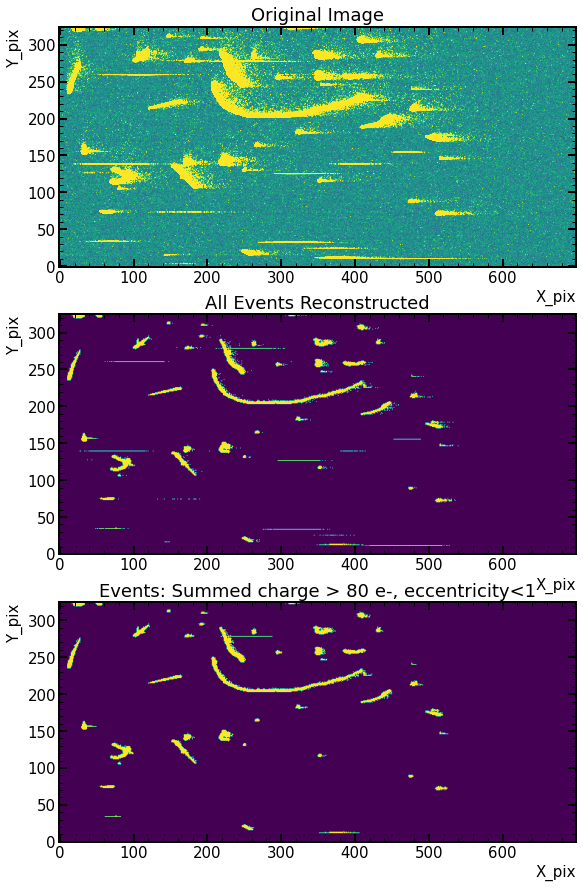

In [17]:
fig=plt.figure(figsize=(25,15))
plt.subplot(313)
plt.imshow(HE_events)
plt.title('Events: Summed charge > 80 e-, eccentricity<1')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
# plt.colorbar()
plt.subplot(312)
plt.title('All Events Reconstructed')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.imshow(label!= 0)
plt.subplot(311)
plt.imshow(data[1],vmin=-1,vmax=1)
plt.title('Original Image')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.savefig('IMAGES_RECOHE.png', bbox_inches='tight', dpi=100)

plt.show()

In [18]:
mask_bleeding=ndimage.morphology.binary_dilation(HE_events>0,structure=[[0,0,0],[0,1,1],[0,0,0]],
                                             iterations=40)*1.0#-(HE_events>0)*1.0

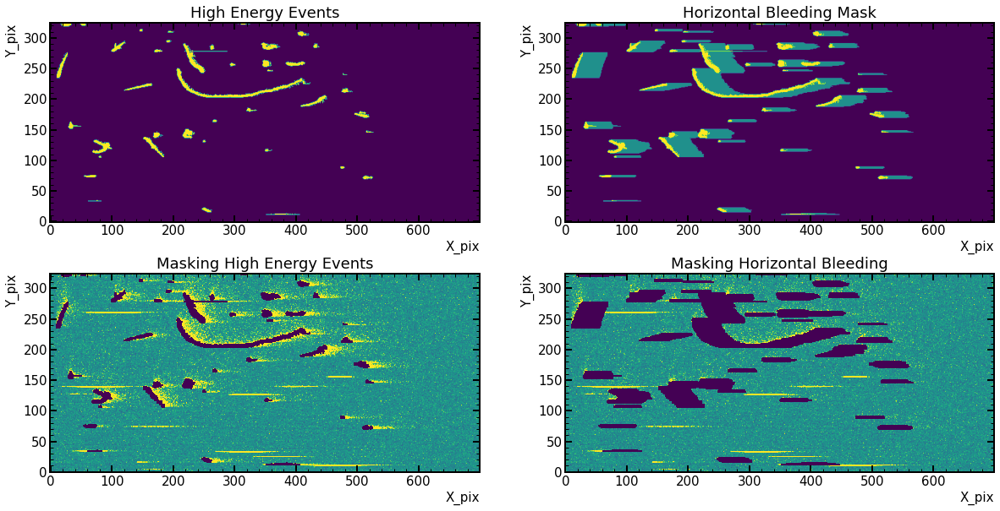

In [19]:
plt.figure(figsize=(20,10))
# plt.subplot(223)
# plt.imshow(data[0],vmin=-1,vmax=1)
# plt.title('Original Image')
plt.subplot(221)
plt.imshow(HE_events)
plt.title('High Energy Events')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.subplot(222)
plt.imshow(mask_bleeding+(HE_events>0)*1)
plt.title('Horizontal Bleeding Mask')

plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.subplot(223)
plt.imshow(data[1]+((HE_events>0))*-1e7,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')

# plt.colorbar()
plt.title('Masking High Energy Events')
plt.subplot(224)
plt.imshow(data[1]+((mask_bleeding+HE_events>0))*-1e7,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')

plt.title('Masking Horizontal Bleeding')
plt.savefig('IMAGES_HBLEED.png', bbox_inches='tight', dpi=100)

plt.show()

In [20]:
maskV_bleeding=ndimage.morphology.binary_dilation(HE_events>0,structure=[[0,0,0],[0,1,0],[0,1,0]],
                                             iterations=20)*1.0#-(HE_events>0)*1.0

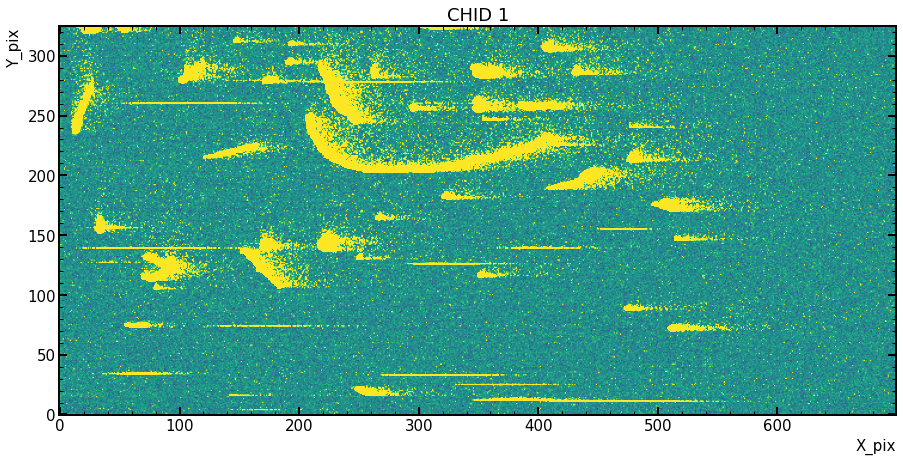

In [21]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1],vmin=-1,vmax=1)
plt.title('CHID 1')
plt.savefig('IMAGES_chid1.png', bbox_inches='tight', dpi=100)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.show()

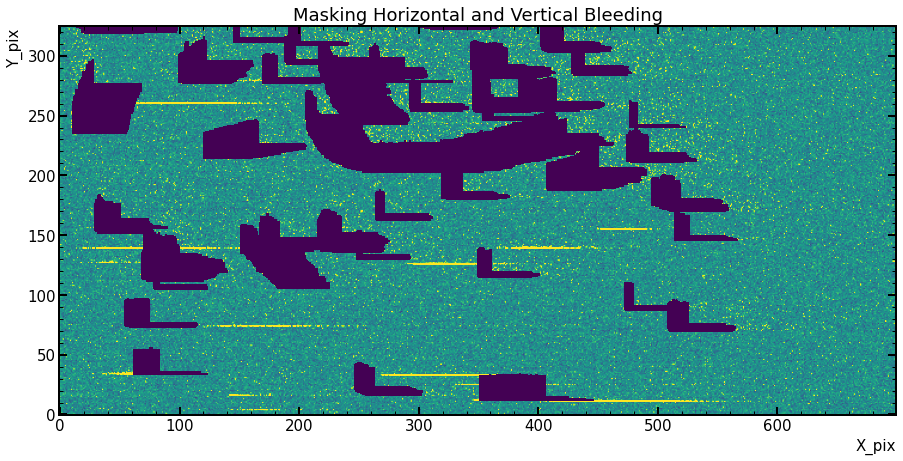

In [34]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1]+((maskV_bleeding+mask_bleeding+HE_events>0))*-1e7,vmin=-1,vmax=1)
plt.title('Masking Horizontal and Vertical Bleeding')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.savefig('IMAGES_BLEED.png', bbox_inches='tight', dpi=100)

plt.show()

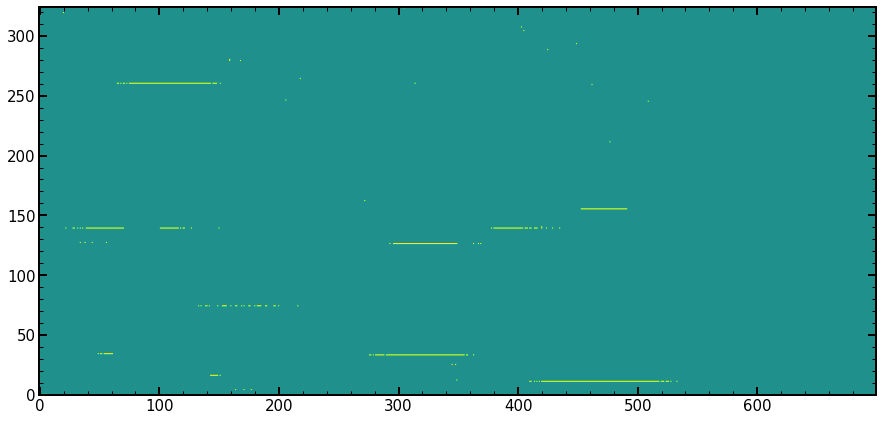

In [23]:
plt.figure(figsize=(15,10))
plt.imshow((data[1]+((maskV_bleeding+mask_bleeding+HE_events>0))*-1e7)>3,vmin=-1,vmax=1)
# plt.title('Masking Horizontal and Vertical Bleeding')
plt.show()

In [36]:
matriz2, dmask=no_sr(data[1]+((maskV_bleeding+mask_bleeding+HE_events))*-1e7,threshold=3,trem=20)

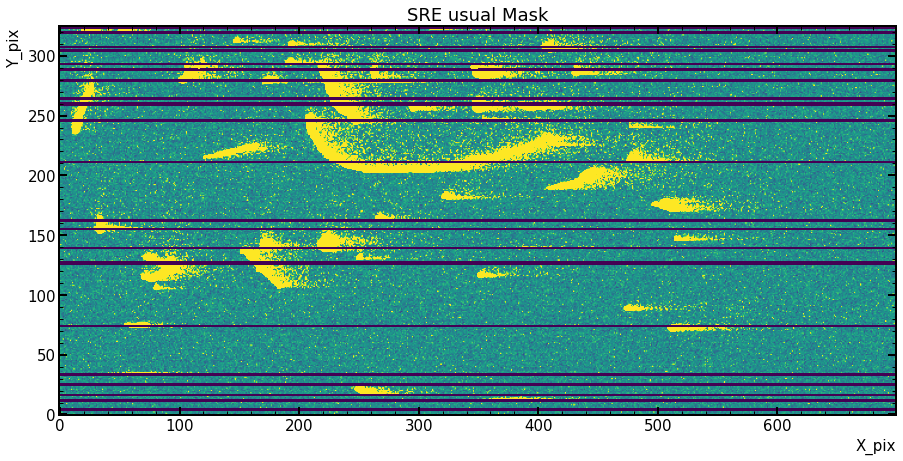

In [37]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1]-dmask*1e7,vmin=-1,vmax=1)
plt.title('SRE usual Mask')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.savefig('IMAGES_SRE_std.png', bbox_inches='tight', dpi=100)
plt.show()

In [38]:
pre_sre=ndimage.label((data[1]+((maskV_bleeding+mask_bleeding+HE_events))*-1e7)>1.5,structure=[[0,0,0],[1,1,1],[0,0,0]])[0]

In [39]:
rps=sk.regionprops(pre_sre,cache=False)
areas=[r.area for r in rps]

SRE_events=np.zeros_like(pre_sre)
for event in np.where(np.array(areas)>1)[0].tolist():
    [x,y]=np.where(pre_sre==event+1)
    for i in range(len(x)):
        SRE_events[x[i],y[i]]=1

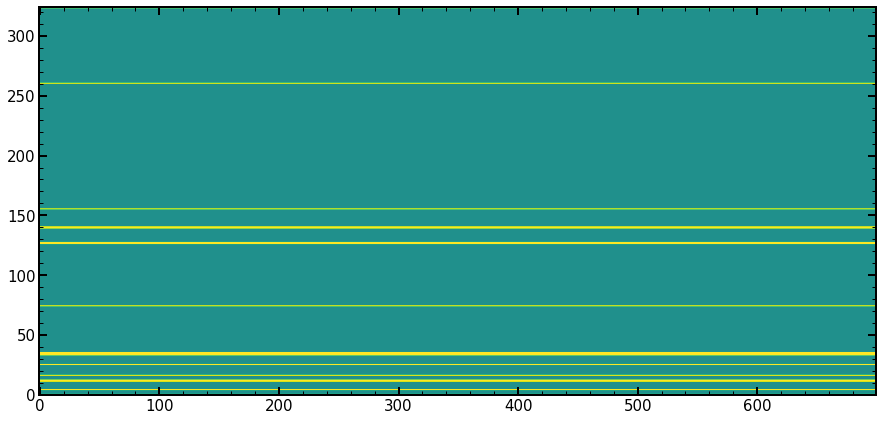

In [46]:
SRE_mask=np.zeros_like(SRE_events)
for y in np.unique(np.where(SRE_events==1)[0]).tolist(): SRE_mask[y,:]=1
plt.figure(figsize=(15,10))
plt.imshow(SRE_mask,vmin=-1,vmax=1)
plt.show()

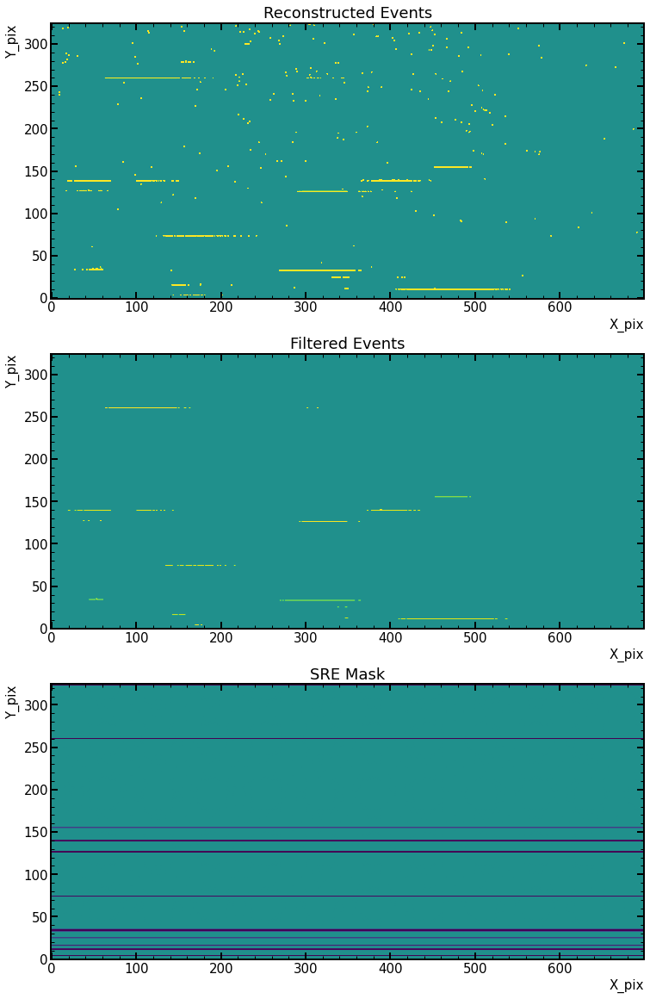

In [48]:
plt.figure(figsize=(25,20))
plt.subplot(311)
plt.imshow(pre_sre,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('Reconstructed Events')
plt.subplot(312)
plt.imshow(SRE_events,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('Filtered Events')
plt.subplot(313)
plt.imshow(-SRE_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE Mask')
plt.savefig('IMAGES_SRE_pre.png', bbox_inches='tight', dpi=100)

plt.show()

In [49]:
np.unique(np.where(SRE_events==1)[0])

array([  0,   4,  11,  12,  16,  25,  33,  34,  35,  74, 126, 127, 139,
       140, 155, 260, 323])

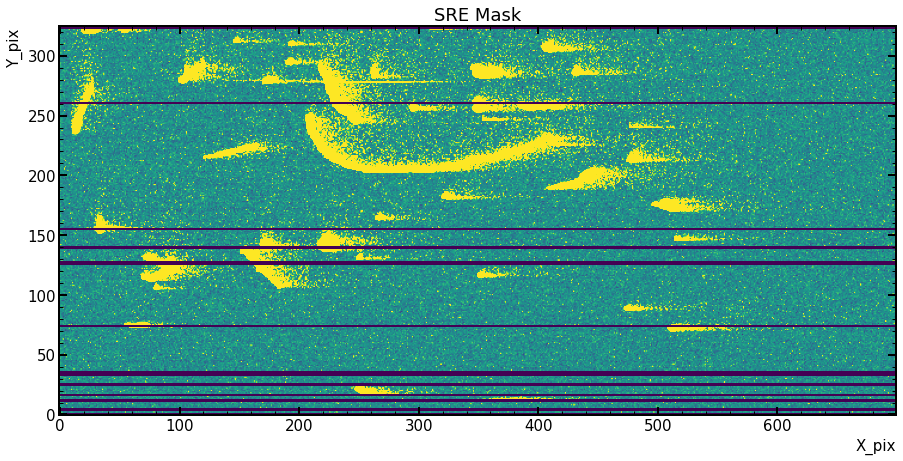

In [50]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1]-1e7*SRE_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE Mask')
plt.savefig('IMAGES_SRE_MASK.png', bbox_inches='tight', dpi=100)
plt.show()

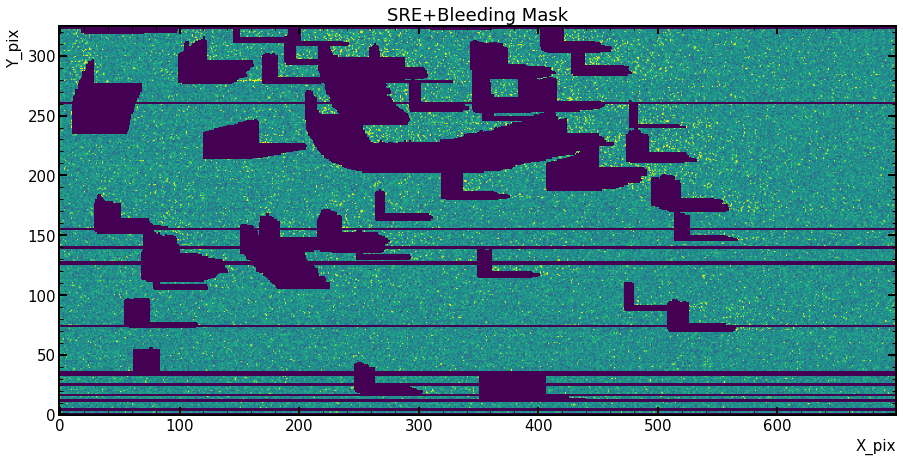

In [52]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1]-1e7*(maskV_bleeding+mask_bleeding+SRE_mask),vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE+Bleeding Mask')
plt.savefig('IMAGES_TOTALMASK.png', bbox_inches='tight', dpi=100)
plt.show()

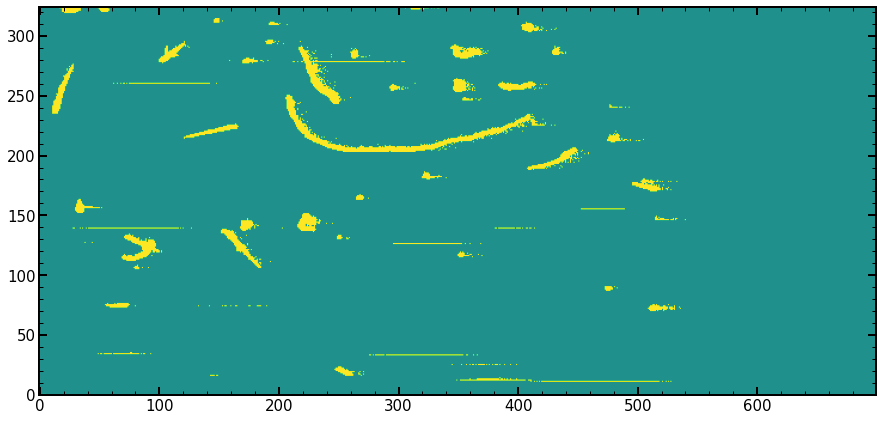

In [54]:
plt.figure(figsize=(15,10))
plt.imshow(label!=0,vmin=-1,vmax=1)
plt.show()

In [55]:
def sum_intensity(region, intensities):
    return np.sum(intensities[region])

rps=sk.regionprops(label,intensity_image=data[1],cache=False, extra_properties=[sum_intensity])
areas=[r.area for r in rps]
energy=[r.sum_intensity for r in rps]
centr=[r.weighted_centroid for r in rps]
ecce=[r.eccentricity for r in rps]
dic_props={"areas":areas,"energias":energy,'centroid':centr, "excentricidade":ecce}

In [160]:
flag0=[]
for i in range(len(centr)):
    if int(centr[i][0]) not in np.unique(np.where(SRE_events==1)[0]).tolist():
        
        flag0.append(i)

In [161]:
flag0_events=np.zeros_like(label)
for event in flag0:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        flag0_events[x[i],y[i]]=1

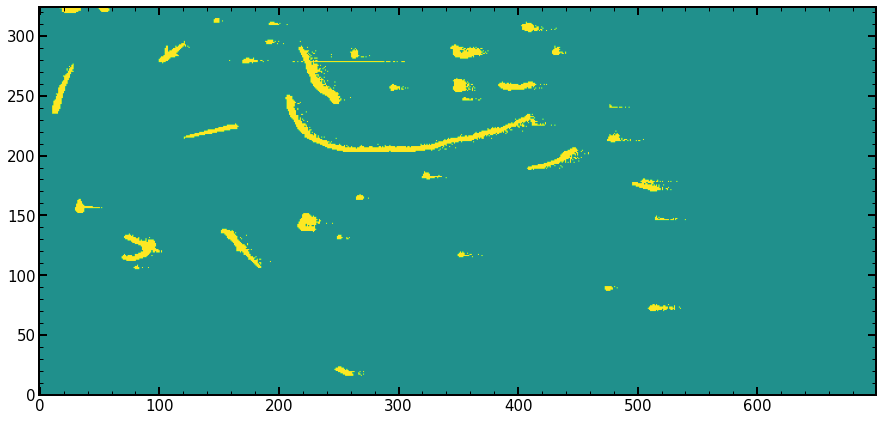

In [162]:
plt.figure(figsize=(15,10))
plt.imshow(flag0_events,vmin=-1,vmax=1)
plt.show()

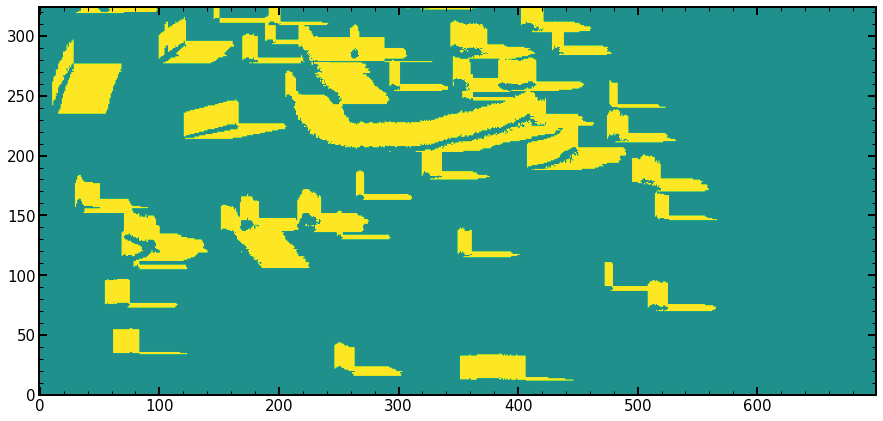

In [56]:
plt.figure(figsize=(15,10))
plt.imshow(maskV_bleeding+mask_bleeding-2*HE_events,vmin=-1,vmax=1)
plt.show()

In [58]:
type(centr[0] )

tuple

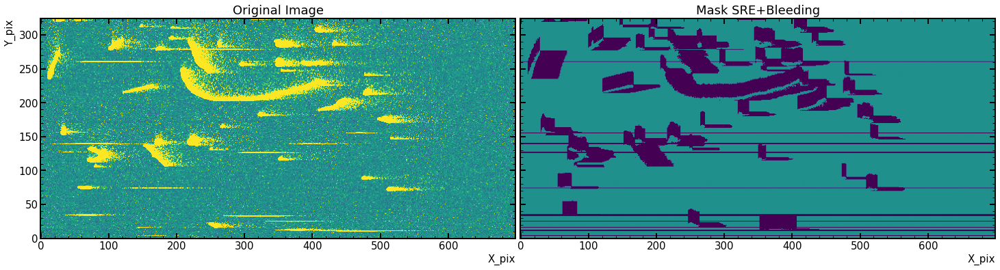

In [70]:
fig=plt.figure(figsize=(25,15))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(data[1],vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.subplot(122)
plt.imshow(-(maskV_bleeding+mask_bleeding-2*HE_events+SRE_mask),vmin=-1,vmax=1)
plt.title('Mask SRE+Bleeding')
plt.tick_params('y', labelleft=False)
plt.subplots_adjust(wspace=0.01)
plt.xlabel('X_pix')
plt.savefig('Imageandmask.png', bbox_inches='tight', dpi=100)
plt.show()

In [73]:
summask=maskV_bleeding+mask_bleeding-2*HE_events+SRE_mask
bigmask=np.where(summask > 0, 1, 0)
Bary0=[]
Index=[]
for i in range(len(centr)):
    bary=tuple(int(item) for item in centr[i]) 
    if bigmask[bary[0],bary[1]]!=1:
        Bary0.append(bary)
        Index.append(i)

In [74]:
Flag0_events=np.zeros_like(label)
for event in Index:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        Flag0_events[x[i],y[i]]=1

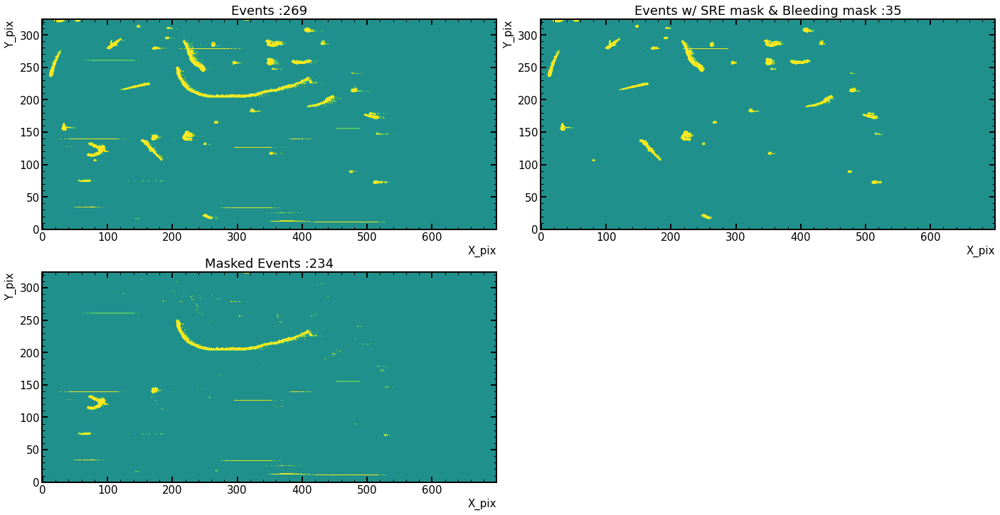

In [160]:
fig=plt.figure(figsize=(25,12))
plt.subplot(222)
plt.imshow(Flag0_events,vmin=-1,vmax=1)
plt.title('Events w/ SRE mask & Bleeding mask :'+str(len(Index)))
plt.xlabel("X_pix")
plt.ylabel("Y_pix")
plt.subplots_adjust(wspace=0.01)
plt.subplot(223)
plt.imshow((label!=0)-Flag0_events,vmin=-1,vmax=1)
plt.title('Masked Events :'+str(len(np.unique(label).tolist())-len(Index)))
plt.xlabel("X_pix")
plt.ylabel("Y_pix")
plt.subplots_adjust(wspace=0.01)
plt.subplot(221)
plt.imshow(label!=0,vmin=-1,vmax=1)
plt.title('Events :'+str(len(np.unique(label).tolist())))
plt.savefig('Recov2.png', bbox_inches='tight', dpi=100)
plt.xlabel("X_pix")
plt.ylabel("Y_pix")
plt.subplots_adjust(wspace=0.01)
plt.show()

268  baricenters


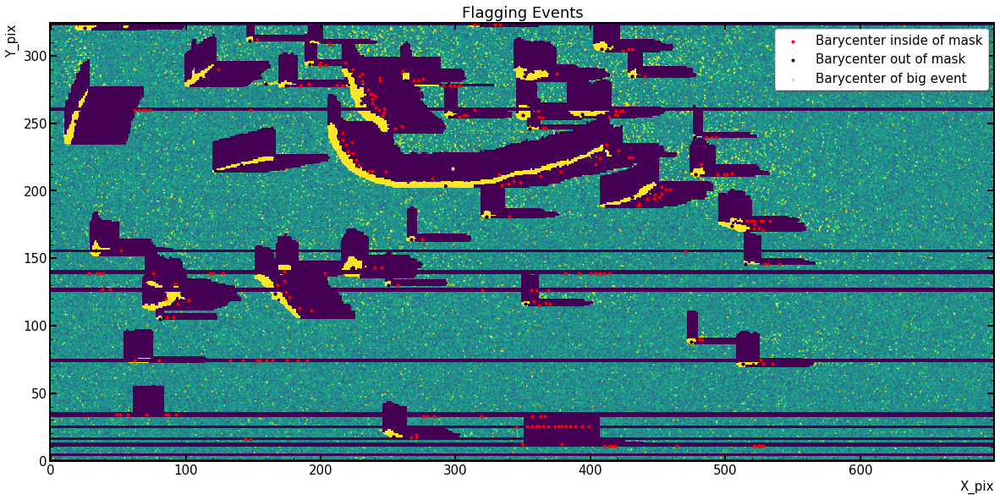

In [117]:
fig=plt.figure(figsize=(20,15))
plt.imshow(data[1]-bigmask*1e7,vmin=-1,vmax=1)
count=0
for i in range(len(centr)):
    bary=tuple(int(item) for item in centr[i]) 
    count+=1
    if i==0:plt.scatter(bary[1],bary[0],c='r',marker='.',label='Barycenter inside of mask')
    else: plt.scatter(bary[1],bary[0],marker='.',c='r')
print(count,' baricenters')
for baries in Bary0:
    plt.scatter(baries[1],baries[0],marker='.',c='k')
plt.scatter(baries[1],baries[0],marker='.',c='k',label='Barycenter out of mask')
plt.scatter(centr[144][1],centr[144][0],marker='.',c='pink',label='Barycenter of big event')
plt.legend(shadow=True)
plt.xlabel("X_pix")
plt.ylabel("Y_pix")
plt.title("Flagging Events")
plt.savefig('Baryv2.png', bbox_inches='tight', dpi=100)

plt.show()

268  baricenters


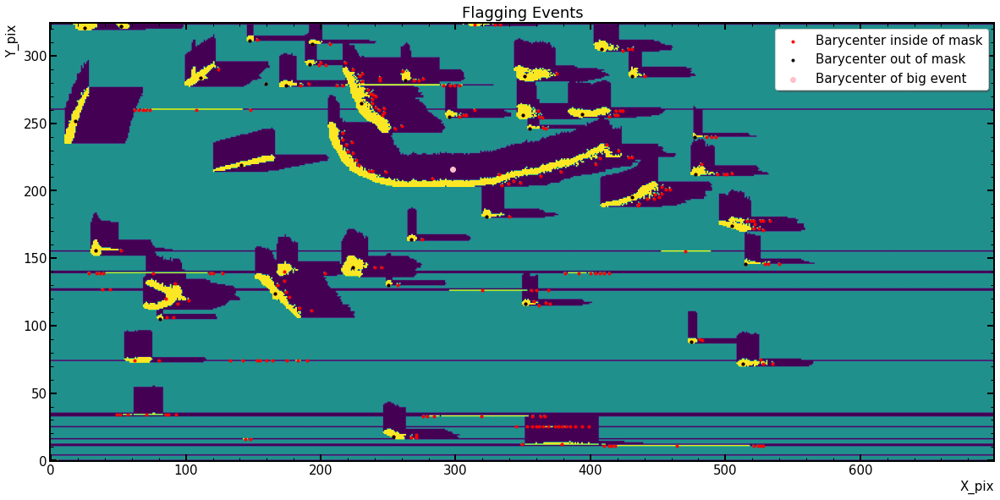

In [116]:
fig=plt.figure(figsize=(20,10))
MASK=2*(label!=0)-bigmask
# mask_eve=np.where((label!=0)==1,bigmask, -1)
# plt.imshow(-mask_eve,vmin=-1,vmax=1)
# plt.imshow(label!=0,vmin=-1,vmax=1)
plt.imshow(MASK,vmin=-1,vmax=1)

count=0
for i in range(len(centr)):
    bary=tuple(int(item) for item in centr[i]) 
    count+=1
    if i==0:plt.scatter(bary[1],bary[0],c='r',marker='.',label='Barycenter inside of mask')
    else: plt.scatter(bary[1],bary[0],c='r',marker='.')
print(count,' baricenters')
for baries in Bary0:
    plt.scatter(baries[1],baries[0],c='k',marker='.')
plt.scatter(baries[1],baries[0],c='k',marker='.',label='Barycenter out of mask')
plt.scatter(int(centr[144][1]),int(centr[144][0]),c='pink',label='Barycenter of big event')
plt.legend(shadow=True)
plt.xlabel("X_pix")
plt.ylabel("Y_pix")
plt.title("Flagging Events")
plt.savefig('Baryv3.png', bbox_inches='tight', dpi=100)

plt.show()

# SINGLE ELECTRON RATE

In [120]:
event_mask=maskV_bleeding+mask_bleeding
event_halo_mask = ndimage.binary_dilation(
        event_mask>0,
        iterations = 10,
        structure = ndimage.generate_binary_structure(rank=2, connectivity=2) # == [[1,1,1],[1,1,1],[1,1,1]]
    )
event_halo_SR_mask = np.array(SRE_mask,dtype=bool)|event_halo_mask

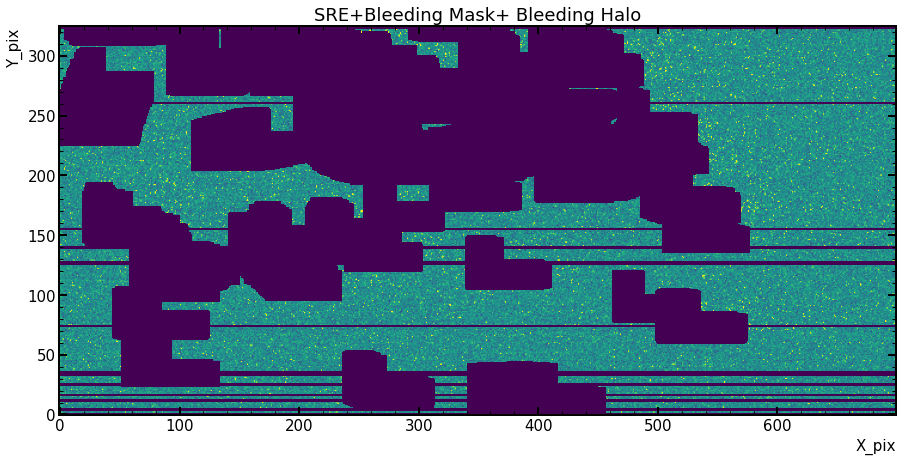

In [152]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1]-1e7*event_halo_SR_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE+Bleeding Mask+ Bleeding Halo')
plt.savefig('SER.png', bbox_inches='tight', dpi=100)
plt.show()

In [123]:
convolution_mask = np.s_[5:int(hdu_list[1].header["CCDNROW"])-5, 15:-(osc+5)]
masked_data = np.where(event_halo_SR_mask , np.nan, data[1] )
masked_hist, bins = np.histogram( masked_data[convolution_mask], np.arange(-0.5, 2.5, .01) )
x = (bins[1:]+bins[:-1])/2

In [133]:
sigma_list, sigma_errLlist=LocalSigma(data,extensions=4)
global sigma
sigmaN=sigma_list[1]
def poisson_normN(x, mu, A, lamb, Nmax=5): #sigma parameter global 
    y = 0.
    for i in range(0, Nmax+1):
        y += (lamb**i)/float(math.factorial(i)) *np.exp(-0.5*((x-i-mu-lamb)/float(sigmaN))**2)
    return A*np.exp(-lamb)*y/(np.sqrt(2*np.pi*sigmaN**2))

In [140]:

try:
    popt, pcov = curve_fit( 
        poisson_normN, 
        x, 
        masked_hist, 
        p0=[-0.4, 1000, 0.05],
    )
except (RuntimeError,OptimizeWarning,RuntimeWarning):
    print( f"Error - dc fit failed at" )

In [146]:
print(popt)
chid=1
start=parse(hdu_list[chid].header["DATESTART"]+"Z").timestamp()
end=parse(hdu_list[chid].header["DATEEND"]+"Z").timestamp()
time=datetime.timedelta(seconds=end-start)
readout_time=time.total_seconds()/86400 #readout time in days

exposure_time=readout_time*int(hdu_list[chid].header["CCDNROW"])/(2*int(hdu_list[chid].header["NROW"]))
print(exposure_time)
perr = np.sqrt(np.diag(pcov))
dc = popt[2]/exposure_time # electron/pix/day
dc_err = perr[2]/exposure_time # electron/pix/day
print(dc,dc_err)

[-2.10455681e-02  6.65965431e+02  2.07857940e-02]
0.05152051282051283
0.4034469550815386 0.03938090554367214


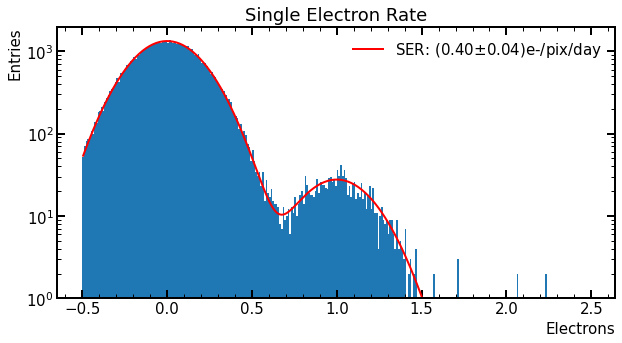

In [153]:
fig=plt.figure(figsize=(10,5))
plt.bar(x,masked_hist,width=0.01)
plt.plot(x,poisson_normN(x,*popt),linewidth=2,c='r',label=r'SER: ({:.2f}$\pm${:.2f})e-/pix/day'.format(dc,dc_err))
plt.yscale('log')
plt.ylim(1,2e3)
plt.ylabel('Entries')
plt.xlabel('Electrons')
plt.title('Single Electron Rate')
plt.legend()
plt.savefig('SER_HISTO.png', bbox_inches='tight', dpi=100)

plt.show()

In [184]:
centr[144]

(216.3051769463839, 298.06559459249036)

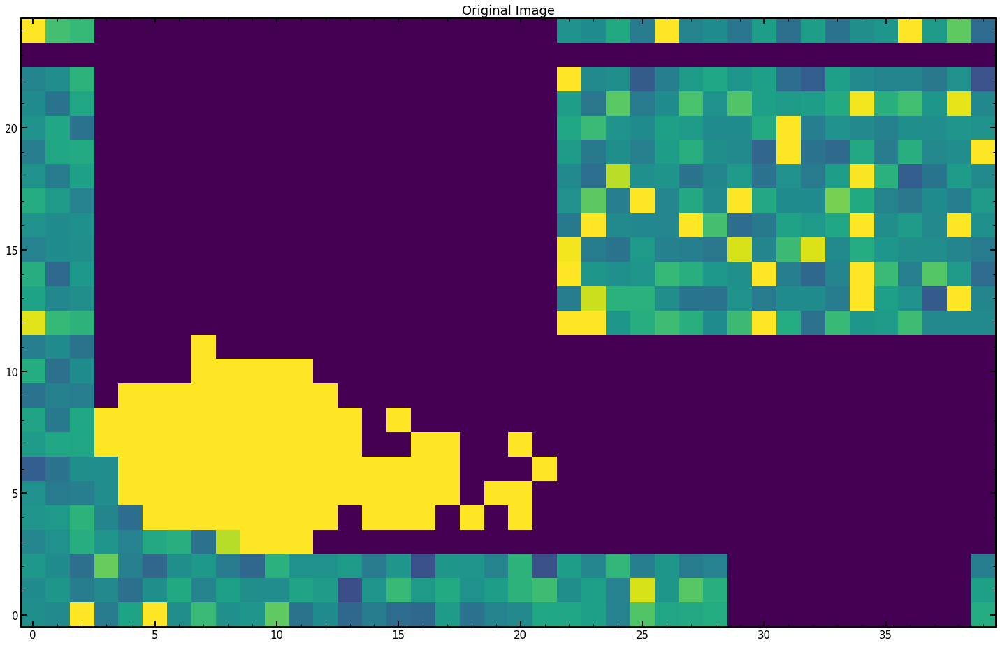

In [77]:
fig=plt.figure(figsize=(25,25))
# plt.subplot(121)
plt.title('Original Image')
plt.imshow((data[1]-(maskV_bleeding+mask_bleeding-2*HE_events+SRE_mask)*1e7)[300:,400:440],vmin=-1,vmax=1)

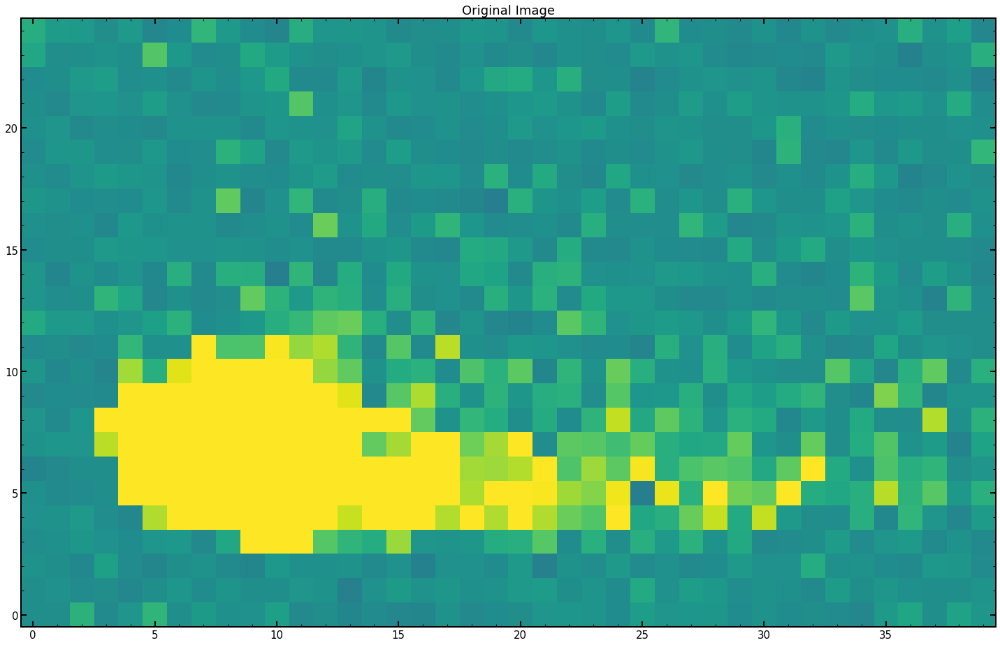

In [78]:
fig=plt.figure(figsize=(25,25))
# plt.subplot(121)
plt.title('Original Image')
plt.imshow(data[1][300:,400:440],vmin=-4,vmax=4)

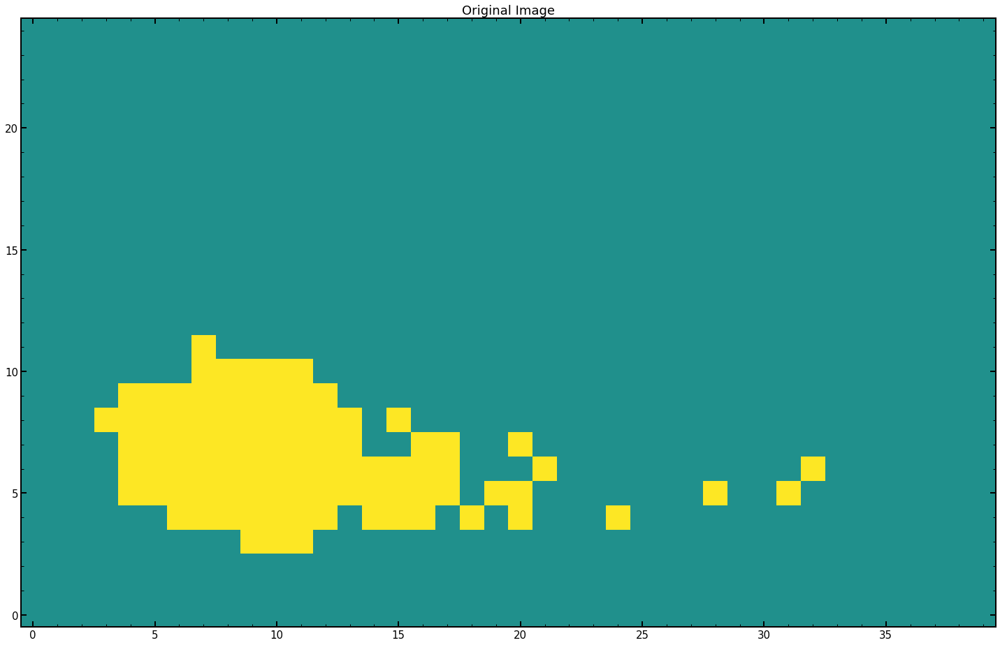

In [79]:
fig=plt.figure(figsize=(25,25))
# plt.subplot(121)
plt.title('Original Image')
plt.imshow((label!=0)[300:,400:440],vmin=-1,vmax=1)